#  Polymer Melt Flow Rate 

##  Import Polymer MFR Data

In [100]:
import pandas as pd 
import numpy as np 

data = pd.read_csv('polymer_reactor.txt')
data.columns = ['Time' , 'C3=' ,'H2R' , 'Pressure' , 'Level' , 'C2=' , 'Cat' , 'Temp' , 'MFR']
data['lnMFR'] = np.log(data['MFR'].values)
data.describe()

,C3=,H2R,Pressure,Level,C2=,Cat,Temp,MFR,lnMFR
count,2486.000000,2560.000000,2484.000000,2484.000000,2484.00000,2486.000000,2484.000000,2564.000000,2564.000000
mean,25306.285729,0.178427,30.663706,77.651055,42525.14000,0.138530,80.144365,8.185218,1.901381
std,1706.481672,0.077473,0.423345,0.919600,11331.86896,0.041869,0.823554,5.088696,0.638107
min,16106.025000,0.000000,26.946344,74.575958,9610.46480,0.022162,77.760117,1.500000,0.405465
25%,24361.632000,0.136000,30.446129,76.992151,34795.53500,0.113764,79.677458,3.700000,1.308333
50%,25365.754500,0.173500,30.622631,77.494477,41550.56250,0.132986,80.044308,4.300000,1.458615
75%,26398.452250,0.200000,30.925738,78.210867,50010.29500,0.156990,80.496296,12.900000,2.557227
max,30083.688000,0.980000,32.674332,83.841675,106073.61000,0.677979,91.566544,38.000000,3.637586


In [70]:
from pandas_profiling import ProfileReport 

profile = ProfileReport(data , explorative = True , minimal =False)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [71]:
profile.to_widgets()

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

##  Visualize MFR

In [72]:
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px 

In [101]:
data = data.dropna()
data.head()

,Time,C3=,H2R,Pressure,Level,C2=,Cat,Temp,MFR,lnMFR
0,04-05-18 19:45,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4,1.223775
1,04-05-18 21:45,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2,1.163151
2,04-05-18 23:45,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2,1.163151
3,04-06-18 1:45,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1,1.131402
4,04-06-18 3:45,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3,1.193922


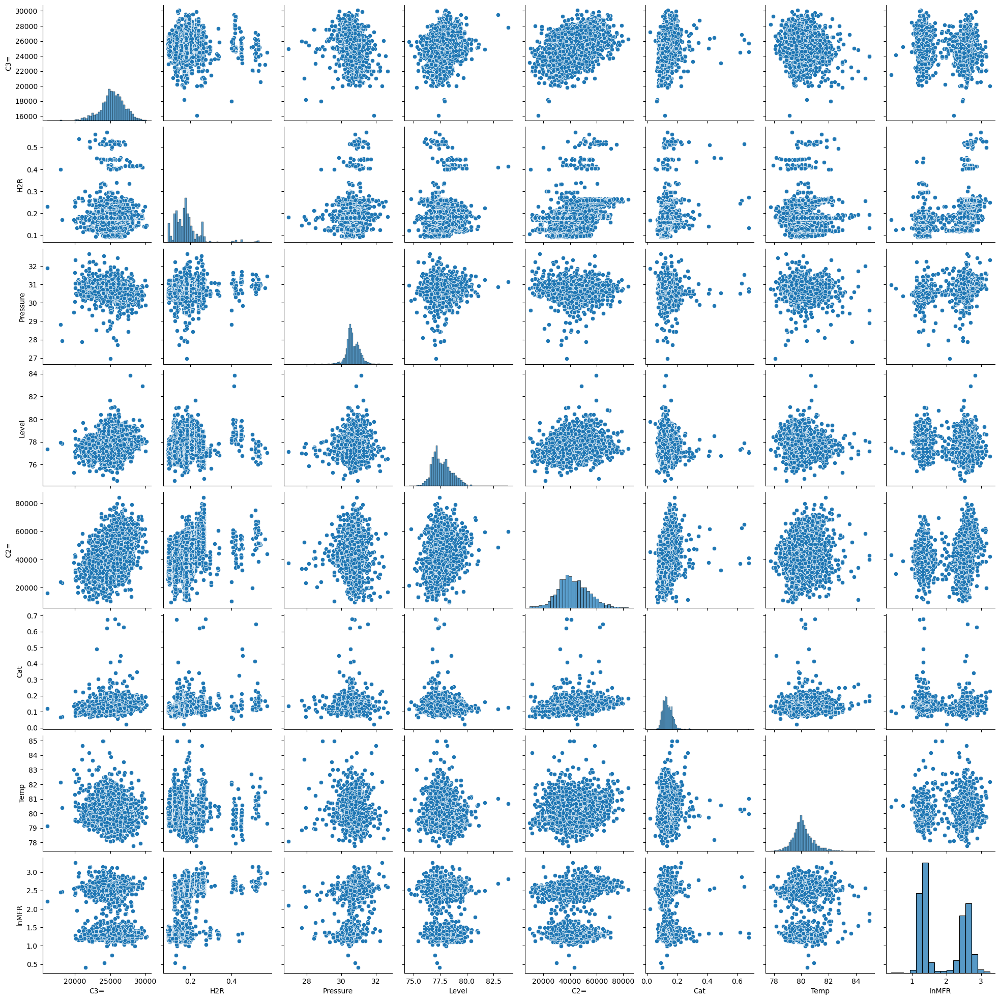

In [95]:
sns.pairplot(data)
plt.show()

A joint plot shows two variables , with the unvariate and joint distribution kind = "kde" , "hex" ,"reg"

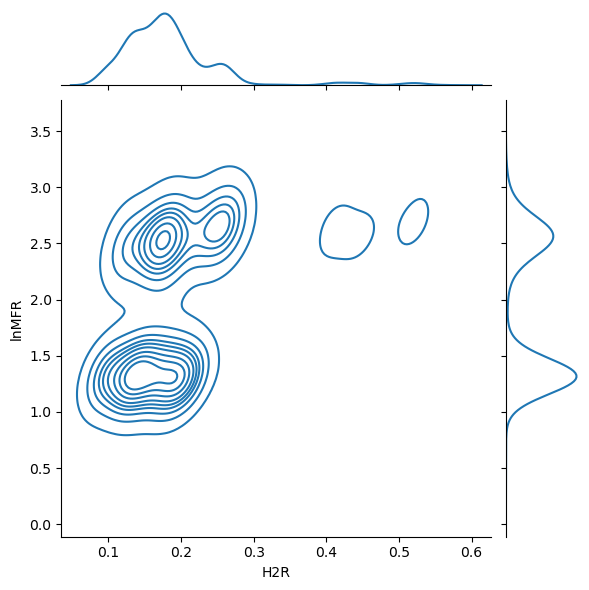

In [93]:
sns.jointplot(x='H2R', y='lnMFR' , data = data , kind ='kde')
plt.show()

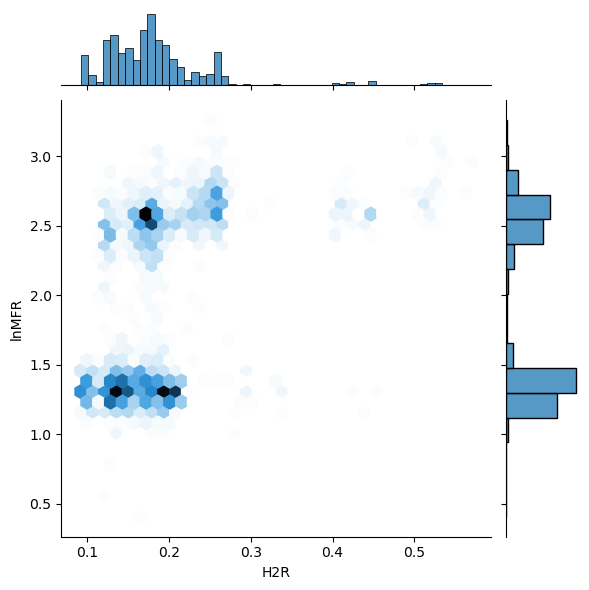

In [94]:
sns.jointplot(x='H2R', y='lnMFR' , data = data , kind ='hex')
plt.show()

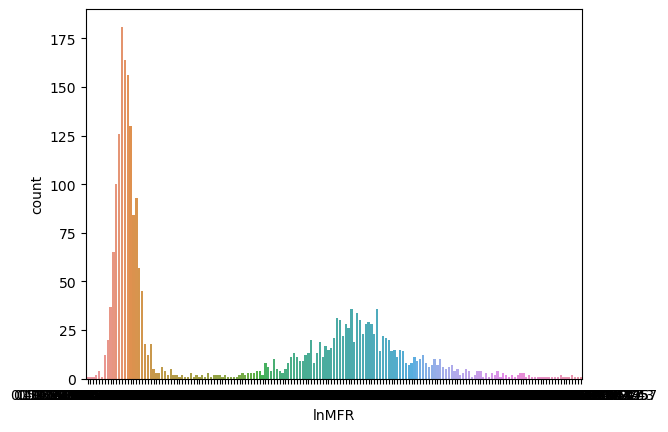

In [79]:
sns.countplot(x=data['lnMFR'])
plt.show()

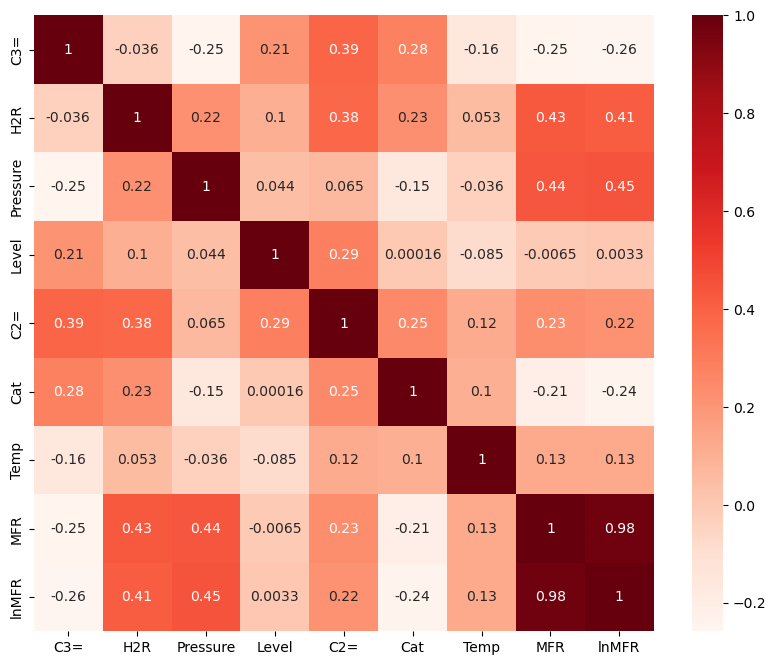

In [85]:
plt.figure(figsize =(10,8))
cor = data.corr()
sns.heatmap(cor , annot=True , cmap=plt.cm.Reds)
plt.show()

##  Prepare data 

In [86]:
plt.figure(figsize = (12,8))
data.plot(kind = 'box' ,subplots = True , layout = (3,4)  , figsize =(14, 14))

C3=            AxesSubplot(0.125,0.653529;0.168478x0.226471)
H2R         AxesSubplot(0.327174,0.653529;0.168478x0.226471)
Pressure    AxesSubplot(0.529348,0.653529;0.168478x0.226471)
Level       AxesSubplot(0.731522,0.653529;0.168478x0.226471)
C2=            AxesSubplot(0.125,0.381765;0.168478x0.226471)
Cat         AxesSubplot(0.327174,0.381765;0.168478x0.226471)
Temp        AxesSubplot(0.529348,0.381765;0.168478x0.226471)
MFR         AxesSubplot(0.731522,0.381765;0.168478x0.226471)
lnMFR              AxesSubplot(0.125,0.11;0.168478x0.226471)
dtype: object

In [102]:
data = data[data['H2R']<0.7]
data = data[data['H2R']>0.01]
data = data[data['C2=']<100000]
data = data[data['MFR']<30]
data = data[data['Temp']<86]
data.head()

,Time,C3=,H2R,Pressure,Level,C2=,Cat,Temp,MFR,lnMFR
0,04-05-18 19:45,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4,1.223775
1,04-05-18 21:45,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2,1.163151
2,04-05-18 23:45,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2,1.163151
3,04-06-18 1:45,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1,1.131402
4,04-06-18 3:45,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3,1.193922


<Figure size 1200x800 with 0 Axes>

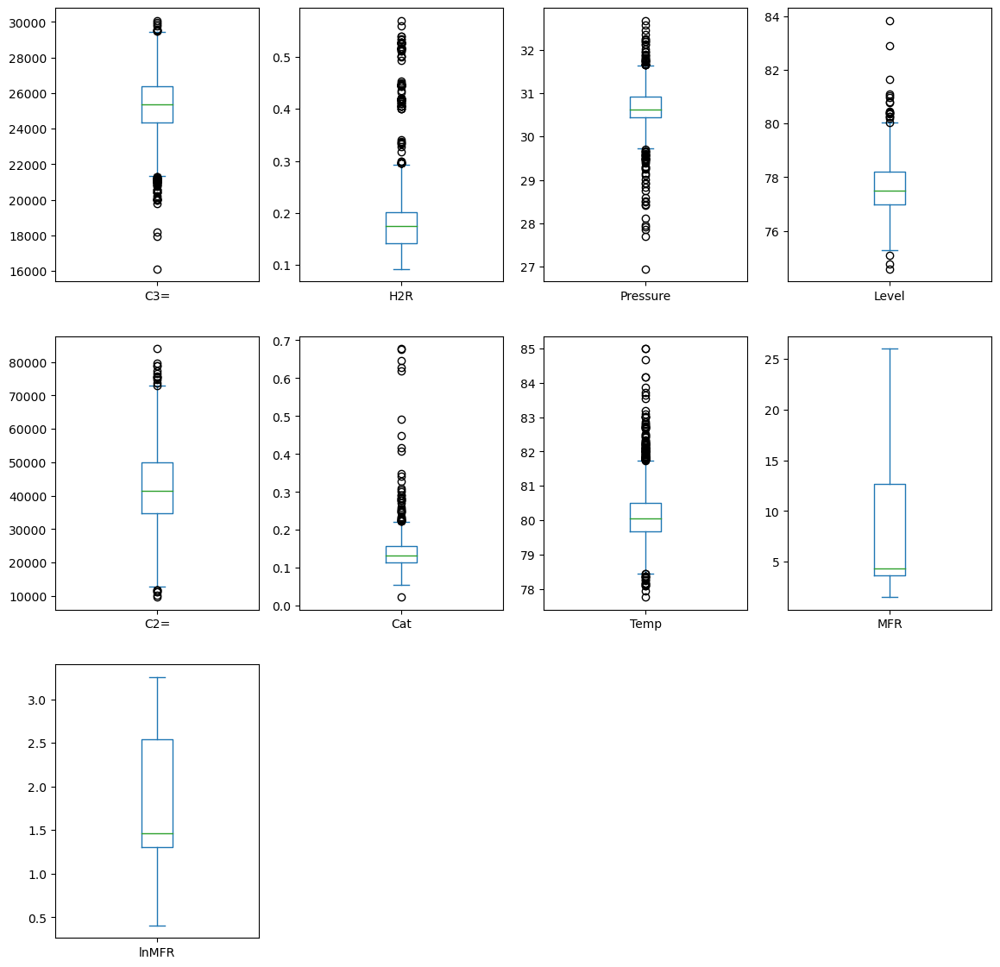

In [91]:
plt.figure(figsize = (12,8))
data.plot(kind = 'box' ,subplots = True , layout = (3,4)  , figsize =(14, 14))
plt.show()

In [103]:
del data['MFR']  
del data['Time'] 

data.head()

,C3=,H2R,Pressure,Level,C2=,Cat,Temp,lnMFR
0,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,1.223775
1,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,1.163151
2,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,1.163151
3,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,1.131402
4,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,1.193922


## Scale Data

In [104]:
from sklearn.preprocessing import StandardScaler
s = StandardScaler()
ds = s.fit_transform(data)
type(ds)

numpy.ndarray

In [105]:
ds = pd.DataFrame(ds,columns = data.columns)
ds.head()

,C3=,H2R,Pressure,Level,C2=,Cat,Temp,lnMFR
0,-0.267722,-0.450321,-0.590237,2.185164,0.738478,0.612474,0.340288,-1.034155
1,0.133386,-0.450321,-0.324407,0.959531,-0.025804,-0.209650,-1.649118,-1.130084
2,0.222967,-0.450321,-0.729100,1.297202,0.249565,0.276673,-1.705004,-1.130084
3,-0.125014,-0.450321,0.544888,1.657567,0.049306,0.313642,-1.440394,-1.180321
4,-0.269279,-0.493499,0.039058,1.117123,-0.187639,-0.381423,-1.420009,-1.081392


##  Divide Data 

In [106]:
from sklearn.model_selection import train_test_split
train , test = train_test_split(ds , test_size=0.2 , shuffle =True)
print(len(train) , len(test))

1971 493


##  Save Data 

In [108]:
import pickle 
info = [data , train , test , ds , s]


with open('mfr_data.pkl' , 'wb') as handle : 
    pickle.dump(info , handle , protocol = pickle.HIGHEST_PROTOCOL)

# MFR Regression 

In [109]:
with open('mfr_data.pkl' , 'rb') as handle : 
    info = pickle.load(handle)
data,test,traini,ds,s = info 
data.head()

,C3=,H2R,Pressure,Level,C2=,Cat,Temp,lnMFR
0,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,1.223775
1,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,1.163151
2,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,1.163151
3,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,1.131402
4,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,1.193922


##  Linear Regression 

Slope , Intercept[4.0715357  1.12699813]


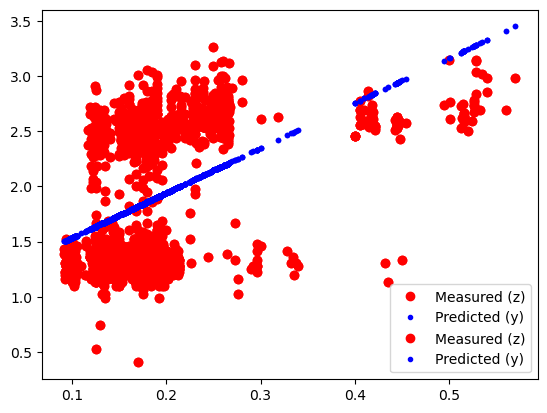

In [113]:
x = data['H2R'].values 
z = data['lnMFR'].values
p1 = np.polyfit(x,z,1)
print('Slope , Intercept'+str(p1))

plt.plot(x,z,'ro' , label = 'Measured (z)')
plt.plot(x,np.polyval(p1,x) , 'b.' , label='Predicted (y)')
plt.legend()
plt.show()

In [114]:
x_columns = data.columns[0:-1] ; print(x)
z_columns = data.columns[-1] ; print(z)

x = data[x_columns]
z = data[z_columns]

[0.153 0.153 0.153 ... 0.25  0.185 0.185]
[1.22377543 1.16315081 1.16315081 ... 2.43361336 2.60268969 2.50959926]


In [115]:
import statsmodels.api as sm
xc = sm.add_constant(x)
model = sm.OLS(z,xc).fit()
predictions = model.predict(xc)
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lnMFR   R-squared:                       0.458
Model:                            OLS   Adj. R-squared:                  0.457
Method:                 Least Squares   F-statistic:                     296.7
Date:                Mon, 07 Nov 2022   Prob (F-statistic):          3.54e-321
Time:                        18:13:16   Log-Likelihood:                -1610.6
No. Observations:                2464   AIC:                             3237.
Df Residuals:                    2456   BIC:                             3284.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -12.9767      1.621     -8.004      0.000     -16.156      -9.797
C3=        -5.203e-05   6.78e-06     -7.671      0.000   -6.53e-05   -3.87e-05
H2R            3.4083      0.158     21.602      0.000       3.099       3.718
Pressure       0.4170      0.024     17.300      0.000       0.370       0.464
Level         -0.0429      0.011     -3.917      0.000      -0.064      -0.021
C2=         1.066e-05   1.06e-06     10.093      0.000    8.59e-06    1.27e-05
Cat           -4.5664      0.249    -18.333      0.000      -5.055      -4.078
Temp           0.0782      0.013      6.184      0.000       0.053       0.103
==============================================================================
Omnibus:                       60.235   Durbin-Watson:                   0.520
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               65.851
Skew:                           0.361   Prob(JB):                     5.02e-15
Kurtosis:                       3.348   Cond. No.                     8.72e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.72e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

##  Select Best Features 

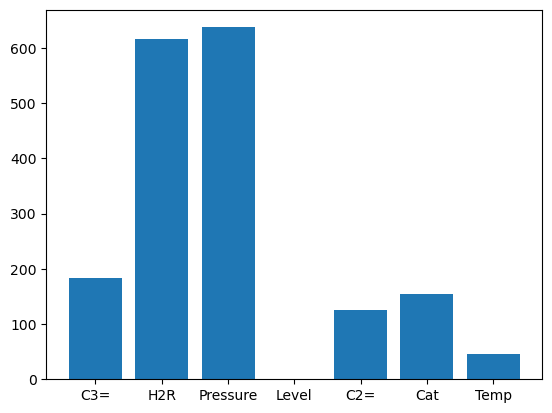

In [116]:
from sklearn.feature_selection import SelectKBest , f_regression
best = SelectKBest(score_func = f_regression , k='all')
fit = best.fit(x,z)
plt.bar(x=x.columns , height = fit.scores_)
plt.show()

# Machine Learning 

##  Function for plotting 

In [119]:
def fit(method): 
    #Creat points for plotting surface 
    xp = np.arange(-5 , 5 , 0.2)
    yp = np.arange(-5 , 5 , 0.2)
    XP, YP = np.meshgrid(xp,yp)
    
    model = method.fit(train[['H2R' , 'Pressure']] , train['lnMFR'])
    zp = method.predict(np.vstack((XP.flatten() , YP.flatten())).T)
    ZP = zp.reshape(np.size(XP ,0) , np.size(XP,1))
    
    r2 = method.score(test[['H2R','Pressure']] , test['lnMFR'])
    print('R^2: '+str(r2))
    
    fig = plt.figure()
    ax = fig.add_subplot(111 , projection = '3d')
    ax.scatter(ds['H2R'] , ds['Pressure'] , ds['lnMFR'] , c=z , cmap='plasma' , label ='data')
    ax.plot_surface(XP , YP , ZP , cmap='coolwarm' , alpha= 0.7 ,
                   linewidth =0  , antialiased = False)
    plt.show()
    return 
    
    

D:\ANACONDA LAST\envs\tf-gpu\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


R^2: 0.3247942338582632


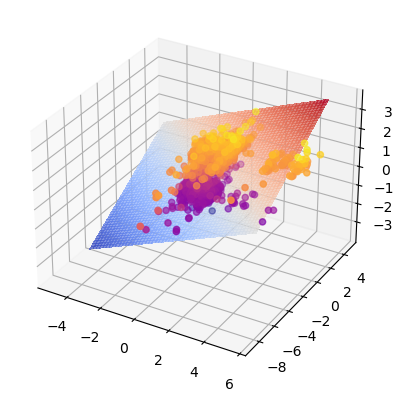

In [121]:
from sklearn import linear_model
lm = linear_model.LinearRegression()
fit(lm)

D:\ANACONDA LAST\envs\tf-gpu\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(


R^2: 0.6298878654943908


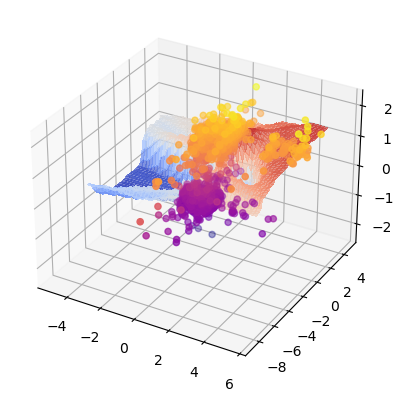

In [122]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor(n_neighbors = 20)
fit(knn)

## Support Vector Regressor 

D:\ANACONDA LAST\envs\tf-gpu\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(


R^2: 0.5357914287529612


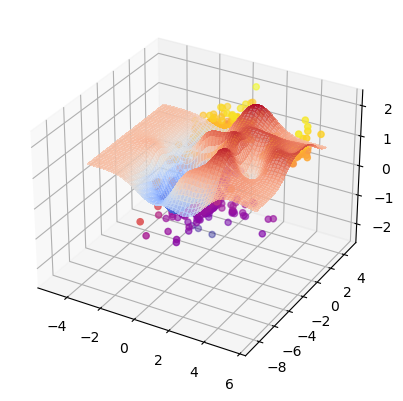

In [123]:
from sklearn import svm 
s = svm.SVR(gamma = 'scale')
fit(s)

##  Multiplayer Perceptron (Neural Network)

D:\ANACONDA LAST\envs\tf-gpu\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
D:\ANACONDA LAST\envs\tf-gpu\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


R^2: 0.6511079923072074


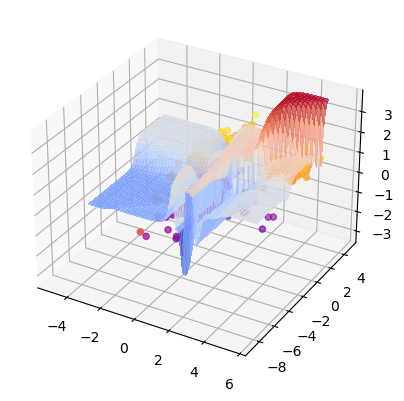

In [124]:
from sklearn.neural_network import MLPRegressor 
# activaiton{'identity' , 'logistic' ,'tanh' , 'relu'},default='relu'
nn = MLPRegressor(hidden_layer_sizes = (5,3,5) , activation = 'tanh' , solver='lbfgs' , max_iter=10000)

fit(nn)

##  Additional Features 

In [125]:
def fitn(method):
    f = train.columns
    model = method.fit(train[f[0:-1]] , train['lnMFR'])
    
    r2 = method.score(test[f[0:-1]] , test['lnMFR'])
    print('R^2 : '+str(r2))
    
    MFR_pred = method.predict(test[f[0:-1]])
    
    plt.plot(test['lnMFR'] , MFR_pred , 'b.')
    plt.plot([-1,2] , [-1,2] ,'k-')
    
    return 

##  Linear Regression 

In [126]:
lm = linear_model.LinearRegression()
fitn(lm)

R^2 : 0.4522710259970685


##  KNeighbors 

In [127]:
knn = KNeighborsRegressor(n_neighbors = 20 )
fitn(knn)

R^2 : 0.7493176559728145


##  Support Vector  Regressor 

In [128]:
s = svm.SVR(gamma = 'scale')
fitn(s)

R^2 : 0.8031088827298265


##  Neural Network 

D:\ANACONDA LAST\envs\tf-gpu\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


R^2: 0.5522988800756015


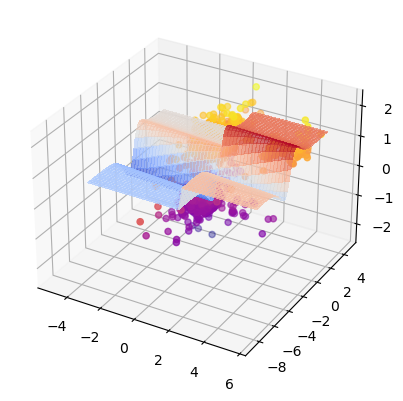

In [155]:
nn = MLPRegressor(hidden_layer_sizes = (3) , max_iter=1000 , \
                 activation = 'tanh' , solver ='lbfgs')
fit(nn)

In [130]:
from keras.models import Sequential 
from keras.layers import*

f = train.columns
n_inputs = len(f) - 1 
nodes = 10 

model = Sequential()
model.add(Dense(n_inputs , input_dim = n_inputs , activation ='linear'))
model.add(Dense(nodes , activation ='linear'))
model.add(Dense(nodes , activation ='tanh'))
model.add(Dense(nodes , activation ='tanh'))
model.add(Dense(nodes , activation ='linear'))
model.add(Dense(1 , activation ='linear'))
model.compile(loss = "mean_squared_error" , optimizer ="adam")

X1 = train.drop('lnMFR' , axis = 1).values 
Y1 = train[['lnMFR']].values

model.fit(X1 , Y1 , epochs=300 , verbose=1 , shuffle = True)

model.save("model.h5")


Epoch 1/300
62/62 [==============================] - 1s 1ms/step - loss: 0.7795
Epoch 2/300
62/62 [==============================] - 0s 1ms/step - loss: 0.5299
Epoch 3/300
62/62 [==============================] - 0s 1ms/step - loss: 0.4555
Epoch 4/300
62/62 [==============================] - 0s 1ms/step - loss: 0.4147
Epoch 5/300
62/62 [==============================] - 0s 1ms/step - loss: 0.3838
Epoch 6/300
62/62 [==============================] - 0s 1ms/step - loss: 0.3633
Epoch 7/300
62/62 [==============================] - 0s 1ms/step - loss: 0.3539
Epoch 8/300
62/62 [==============================] - 0s 1ms/step - loss: 0.3468
Epoch 9/300
62/62 [==============================] - 0s 1ms/step - loss: 0.3371A: 0s - loss: 0.315
Epoch 10/300
62/62 [==============================] - 0s 1ms/step - loss: 0.3283
Epoch 11/300
62/62 [==============================] - 0s 1ms/step - loss: 0.3223
Epoch 12/300
62/62 [==============================] - 0s 1ms/step - loss: 0.3168
Epoch 13/300
62/62

62/62 [==============================] - 0s 1ms/step - loss: 0.2046
Epoch 102/300
62/62 [==============================] - 0s 1ms/step - loss: 0.2058
Epoch 103/300
62/62 [==============================] - 0s 1ms/step - loss: 0.2030
Epoch 104/300
62/62 [==============================] - 0s 1ms/step - loss: 0.2040
Epoch 105/300
62/62 [==============================] - 0s 1ms/step - loss: 0.2030
Epoch 106/300
62/62 [==============================] - 0s 1ms/step - loss: 0.2019
Epoch 107/300
62/62 [==============================] - 0s 967us/step - loss: 0.2026
Epoch 108/300
62/62 [==============================] - 0s 1ms/step - loss: 0.2029
Epoch 109/300
62/62 [==============================] - 0s 1ms/step - loss: 0.2020
Epoch 110/300
62/62 [==============================] - 0s 1000us/step - loss: 0.2015
Epoch 111/300
62/62 [==============================] - 0s 1ms/step - loss: 0.2029
Epoch 112/300
62/62 [==============================] - 0s 1ms/step - loss: 0.2035
Epoch 113/300
62/62 [====

Epoch 201/300
62/62 [==============================] - 0s 1ms/step - loss: 0.1807
Epoch 202/300
62/62 [==============================] - 0s 1ms/step - loss: 0.1813
Epoch 203/300
62/62 [==============================] - 0s 1ms/step - loss: 0.1811
Epoch 204/300
62/62 [==============================] - 0s 951us/step - loss: 0.1809
Epoch 205/300
62/62 [==============================] - 0s 1ms/step - loss: 0.1812
Epoch 206/300
62/62 [==============================] - 0s 1ms/step - loss: 0.1818
Epoch 207/300
62/62 [==============================] - 0s 1ms/step - loss: 0.1805
Epoch 208/300
62/62 [==============================] - 0s 1ms/step - loss: 0.1778
Epoch 209/300
62/62 [==============================] - 0s 1000us/step - loss: 0.1788
Epoch 210/300
62/62 [==============================] - 0s 1ms/step - loss: 0.1794
Epoch 211/300
62/62 [==============================] - 0s 1ms/step - loss: 0.1780
Epoch 212/300
62/62 [==============================] - 0s 1ms/step - loss: 0.1778
Epoch 213/3

In [131]:
X2 = test.drop('lnMFR' , axis = 1).values 
Y2 = test[['lnMFR']].values


mse = model.evaluate(X2 , Y2 , verbose = 1)

print('Mean Squared Error: ',mse)

62/62 [==============================] - 0s 852us/step - loss: 0.1642
Mean Squared Error:  0.16421319544315338


In [133]:
lnMFR_pred = model.predict(X2)
plt.plot(test['lnMFR'] , lnMFR_pred , 'b.')
plt.plot([-1,2] , [-1,2] , 'k-')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

# Linear Regression with Tensorflow and Pytorch  

In [134]:
import tensorflow as tf 
import time 

##  Tensorflwo Linear Regression

In [135]:
data_X = np.array(data['H2R'])
data_Y = np.array(data['lnMFR'])

In [136]:
display_step = 100
learning_rate = 0.01
epochs = 1000 


In [137]:
#weight and bias 
w = tf.Variable(tf.zeros(1) , name='weight')
b = tf.Variable(tf.zeros(1) , name ='bias')

def predict(x):
    return x* w +b

def mse(y_true , y_pred):
    return tf.losses.mean_squared_error(y_true , y_pred)

#SGD optimizer 
optimizer = tf.optimizers.SGD(learning_rate = learning_rate)

In [138]:
history =[]
start = time.time()

for epoch in range(1,epochs + 1 ):
    
    #begin GradientTape and optimise
    with tf.GradientTape() as g : 
        pred = predict(data_X)
        loss = mse(data_Y , pred)
     
    #Compute dw , db 
    gradients = g.gradient(loss , [w,b])

    
    #update  w and b 
    optimizer.apply_gradients(zip(gradients , [w,b]))
    
    #Monitor training / display steps 
    if epochs % display_step == 0: 
        pred = predict(data_X)
        loss = mse(pred , data_Y)
        history.append(np.array(w*data_X + b))
        print("Epochs : %i , Loss : ¨%f , w: %f , b: %f" %(epochs , loss , w.numpy() , b.numpy()))
        
print('Train Time : %f second' %(time.time() - start))
        

Epochs : 1000 , Loss : ¨3.778964 , w: 0.007313 , b: 0.037547
Epochs : 1000 , Loss : ¨3.640082 , w: 0.014481 , b: 0.074315
Epochs : 1000 , Loss : ¨3.506885 , w: 0.021508 , b: 0.110322
Epochs : 1000 , Loss : ¨3.379140 , w: 0.028398 , b: 0.145583
Epochs : 1000 , Loss : ¨3.256624 , w: 0.035151 , b: 0.180114
Epochs : 1000 , Loss : ¨3.139123 , w: 0.041773 , b: 0.213929
Epochs : 1000 , Loss : ¨3.026432 , w: 0.048264 , b: 0.247043
Epochs : 1000 , Loss : ¨2.918353 , w: 0.054629 , b: 0.279471
Epochs : 1000 , Loss : ¨2.814699 , w: 0.060869 , b: 0.311227
Epochs : 1000 , Loss : ¨2.715287 , w: 0.066987 , b: 0.342324
Epochs : 1000 , Loss : ¨2.619944 , w: 0.072986 , b: 0.372778
Epochs : 1000 , Loss : ¨2.528504 , w: 0.078868 , b: 0.402600
Epochs : 1000 , Loss : ¨2.440806 , w: 0.084635 , b: 0.431804
Epochs : 1000 , Loss : ¨2.356698 , w: 0.090291 , b: 0.460402
Epochs : 1000 , Loss : ¨2.276033 , w: 0.095836 , b: 0.488408
Epochs : 1000 , Loss : ¨2.198670 , w: 0.101274 , b: 0.515833
Epochs : 1000 , Loss : ¨

Epochs : 1000 , Loss : ¨0.387646 , w: 0.385324 , b: 1.754500
Epochs : 1000 , Loss : ¨0.387510 , w: 0.385871 , b: 1.755537
Epochs : 1000 , Loss : ¨0.387379 , w: 0.386414 , b: 1.756550
Epochs : 1000 , Loss : ¨0.387253 , w: 0.386952 , b: 1.757542
Epochs : 1000 , Loss : ¨0.387131 , w: 0.387487 , b: 1.758511
Epochs : 1000 , Loss : ¨0.387014 , w: 0.388017 , b: 1.759460
Epochs : 1000 , Loss : ¨0.386902 , w: 0.388544 , b: 1.760387
Epochs : 1000 , Loss : ¨0.386793 , w: 0.389066 , b: 1.761294
Epochs : 1000 , Loss : ¨0.386689 , w: 0.389585 , b: 1.762181
Epochs : 1000 , Loss : ¨0.386588 , w: 0.390101 , b: 1.763048
Epochs : 1000 , Loss : ¨0.386491 , w: 0.390612 , b: 1.763896
Epochs : 1000 , Loss : ¨0.386397 , w: 0.391121 , b: 1.764725
Epochs : 1000 , Loss : ¨0.386306 , w: 0.391625 , b: 1.765535
Epochs : 1000 , Loss : ¨0.386219 , w: 0.392127 , b: 1.766328
Epochs : 1000 , Loss : ¨0.386135 , w: 0.392625 , b: 1.767103
Epochs : 1000 , Loss : ¨0.386054 , w: 0.393119 , b: 1.767860
Epochs : 1000 , Loss : ¨

Epochs : 1000 , Loss : ¨0.382347 , w: 0.459629 , b: 1.794714
Epochs : 1000 , Loss : ¨0.382335 , w: 0.459970 , b: 1.794673
Epochs : 1000 , Loss : ¨0.382323 , w: 0.460311 , b: 1.794631
Epochs : 1000 , Loss : ¨0.382311 , w: 0.460652 , b: 1.794588
Epochs : 1000 , Loss : ¨0.382300 , w: 0.460992 , b: 1.794545
Epochs : 1000 , Loss : ¨0.382288 , w: 0.461333 , b: 1.794502
Epochs : 1000 , Loss : ¨0.382276 , w: 0.461673 , b: 1.794458
Epochs : 1000 , Loss : ¨0.382264 , w: 0.462014 , b: 1.794414
Epochs : 1000 , Loss : ¨0.382252 , w: 0.462354 , b: 1.794369
Epochs : 1000 , Loss : ¨0.382241 , w: 0.462694 , b: 1.794325
Epochs : 1000 , Loss : ¨0.382229 , w: 0.463034 , b: 1.794279
Epochs : 1000 , Loss : ¨0.382217 , w: 0.463374 , b: 1.794234
Epochs : 1000 , Loss : ¨0.382205 , w: 0.463714 , b: 1.794188
Epochs : 1000 , Loss : ¨0.382194 , w: 0.464054 , b: 1.794142
Epochs : 1000 , Loss : ¨0.382182 , w: 0.464394 , b: 1.794095
Epochs : 1000 , Loss : ¨0.382170 , w: 0.464733 , b: 1.794048
Epochs : 1000 , Loss : ¨

Epochs : 1000 , Loss : ¨0.380014 , w: 0.527291 , b: 1.783209
Epochs : 1000 , Loss : ¨0.380003 , w: 0.527622 , b: 1.783148
Epochs : 1000 , Loss : ¨0.379992 , w: 0.527953 , b: 1.783087
Epochs : 1000 , Loss : ¨0.379980 , w: 0.528284 , b: 1.783026
Epochs : 1000 , Loss : ¨0.379969 , w: 0.528615 , b: 1.782965
Epochs : 1000 , Loss : ¨0.379958 , w: 0.528946 , b: 1.782904
Epochs : 1000 , Loss : ¨0.379946 , w: 0.529276 , b: 1.782843
Epochs : 1000 , Loss : ¨0.379935 , w: 0.529607 , b: 1.782782
Epochs : 1000 , Loss : ¨0.379924 , w: 0.529938 , b: 1.782721
Epochs : 1000 , Loss : ¨0.379912 , w: 0.530269 , b: 1.782660
Epochs : 1000 , Loss : ¨0.379901 , w: 0.530599 , b: 1.782599
Epochs : 1000 , Loss : ¨0.379890 , w: 0.530930 , b: 1.782539
Epochs : 1000 , Loss : ¨0.379879 , w: 0.531260 , b: 1.782478
Epochs : 1000 , Loss : ¨0.379867 , w: 0.531591 , b: 1.782417
Epochs : 1000 , Loss : ¨0.379856 , w: 0.531922 , b: 1.782356
Epochs : 1000 , Loss : ¨0.379845 , w: 0.532252 , b: 1.782295
Epochs : 1000 , Loss : ¨

Epochs : 1000 , Loss : ¨0.378460 , w: 0.572994 , b: 1.774761
Epochs : 1000 , Loss : ¨0.378449 , w: 0.573320 , b: 1.774701
Epochs : 1000 , Loss : ¨0.378438 , w: 0.573647 , b: 1.774640
Epochs : 1000 , Loss : ¨0.378427 , w: 0.573973 , b: 1.774580
Epochs : 1000 , Loss : ¨0.378416 , w: 0.574300 , b: 1.774520
Epochs : 1000 , Loss : ¨0.378405 , w: 0.574626 , b: 1.774459
Epochs : 1000 , Loss : ¨0.378394 , w: 0.574953 , b: 1.774399
Epochs : 1000 , Loss : ¨0.378383 , w: 0.575279 , b: 1.774338
Epochs : 1000 , Loss : ¨0.378372 , w: 0.575606 , b: 1.774278
Epochs : 1000 , Loss : ¨0.378361 , w: 0.575932 , b: 1.774217
Epochs : 1000 , Loss : ¨0.378350 , w: 0.576258 , b: 1.774157
Epochs : 1000 , Loss : ¨0.378339 , w: 0.576585 , b: 1.774096
Epochs : 1000 , Loss : ¨0.378328 , w: 0.576911 , b: 1.774036
Epochs : 1000 , Loss : ¨0.378317 , w: 0.577237 , b: 1.773976
Epochs : 1000 , Loss : ¨0.378306 , w: 0.577564 , b: 1.773915
Epochs : 1000 , Loss : ¨0.378295 , w: 0.577890 , b: 1.773855
Epochs : 1000 , Loss : ¨

Epochs : 1000 , Loss : ¨0.376925 , w: 0.618749 , b: 1.766290
Epochs : 1000 , Loss : ¨0.376914 , w: 0.619071 , b: 1.766230
Epochs : 1000 , Loss : ¨0.376903 , w: 0.619394 , b: 1.766171
Epochs : 1000 , Loss : ¨0.376892 , w: 0.619716 , b: 1.766111
Epochs : 1000 , Loss : ¨0.376882 , w: 0.620038 , b: 1.766051
Epochs : 1000 , Loss : ¨0.376871 , w: 0.620361 , b: 1.765992
Epochs : 1000 , Loss : ¨0.376860 , w: 0.620683 , b: 1.765932
Epochs : 1000 , Loss : ¨0.376849 , w: 0.621005 , b: 1.765872
Epochs : 1000 , Loss : ¨0.376839 , w: 0.621327 , b: 1.765813
Epochs : 1000 , Loss : ¨0.376828 , w: 0.621649 , b: 1.765753
Epochs : 1000 , Loss : ¨0.376817 , w: 0.621971 , b: 1.765694
Epochs : 1000 , Loss : ¨0.376807 , w: 0.622293 , b: 1.765634
Epochs : 1000 , Loss : ¨0.376796 , w: 0.622615 , b: 1.765574
Epochs : 1000 , Loss : ¨0.376785 , w: 0.622937 , b: 1.765515
Epochs : 1000 , Loss : ¨0.376774 , w: 0.623259 , b: 1.765455
Epochs : 1000 , Loss : ¨0.376764 , w: 0.623581 , b: 1.765396
Epochs : 1000 , Loss : ¨

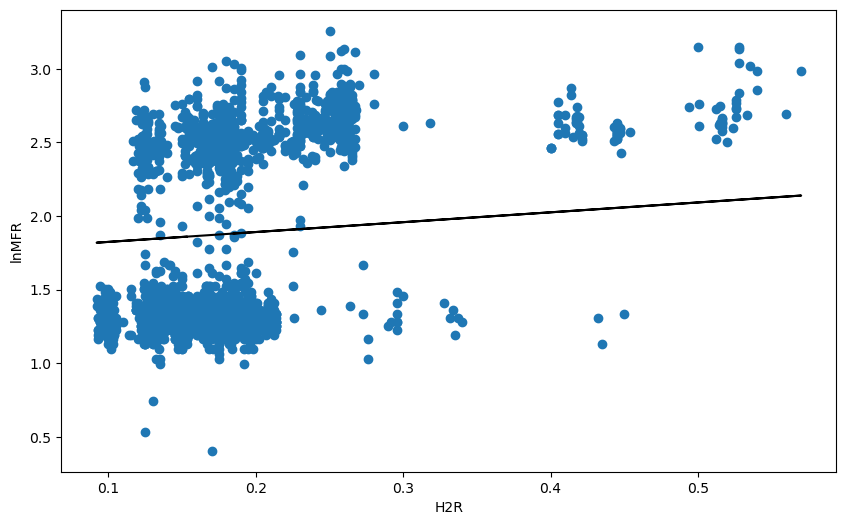

In [154]:
fig = plt.figure(figsize=(10,6))

plt.scatter(data_X , data_Y , label = "Data")

plt.plot(data_X , history[-1] , 'k')
plt.xlabel('H2R')
plt.ylabel('lnMFR')
plt.show()

##  Pytorch Linear Regression 

In [140]:
data_X = data_X.reshape(len(data_X) , 1 )
data_Y = data_Y.reshape(len(data_Y) , 1 )

In [143]:
import torch
from torch.autograd import Variable
class linearRegression(torch.nn.Module):
    def __init__(self, inputSize, outputSize):
        super(linearRegression, self).__init__()
        self.linear = torch.nn.Linear(inputSize, outputSize)

    def forward(self, x):
        out = self.linear(x)
        return out

In [144]:
inputDim = 1 
outputDim = 1 
learningRate = 0.01 
epochs = 100 

model = linearRegression(inputDim , outputDim)

In [145]:
criterion = torch.nn.MSELoss()
optimizer = torch.optim.SGD(model.parameters() , lr = learningRate)

In [149]:
for epoch in range(epochs):
    inputs = Variable(torch.from_numpy(data_X).float())
    labels = Variable(torch.from_numpy(data_Y).float())
    
    
    optimizer.zero_grad()
    
    outputs = model(inputs)
    
    loss = criterion(outputs , labels)
    print(loss)
    
    loss.backward()
    
    optimizer.step()
    

tensor(3.2659, grad_fn=<MseLossBackward0>)
tensor(3.1471, grad_fn=<MseLossBackward0>)
tensor(3.0333, grad_fn=<MseLossBackward0>)
tensor(2.9240, grad_fn=<MseLossBackward0>)
tensor(2.8193, grad_fn=<MseLossBackward0>)
tensor(2.7188, grad_fn=<MseLossBackward0>)
tensor(2.6224, grad_fn=<MseLossBackward0>)
tensor(2.5300, grad_fn=<MseLossBackward0>)
tensor(2.4414, grad_fn=<MseLossBackward0>)
tensor(2.3564, grad_fn=<MseLossBackward0>)
tensor(2.2749, grad_fn=<MseLossBackward0>)
tensor(2.1967, grad_fn=<MseLossBackward0>)
tensor(2.1217, grad_fn=<MseLossBackward0>)
tensor(2.0498, grad_fn=<MseLossBackward0>)
tensor(1.9808, grad_fn=<MseLossBackward0>)
tensor(1.9147, grad_fn=<MseLossBackward0>)
tensor(1.8512, grad_fn=<MseLossBackward0>)
tensor(1.7904, grad_fn=<MseLossBackward0>)
tensor(1.7320, grad_fn=<MseLossBackward0>)
tensor(1.6761, grad_fn=<MseLossBackward0>)
tensor(1.6224, grad_fn=<MseLossBackward0>)
tensor(1.5709, grad_fn=<MseLossBackward0>)
tensor(1.5215, grad_fn=<MseLossBackward0>)
tensor(1.47

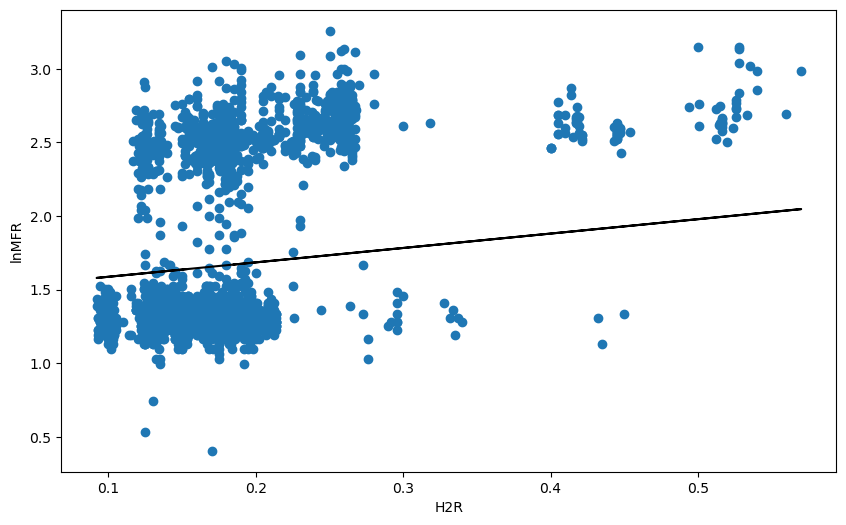

In [153]:
with torch.no_grad():
    predicted = model(Variable(torch.from_numpy(data_X).float())).data.numpy()

fig = plt.figure(figsize=(10,6))
plt.scatter(data_X , data_Y)
plt.plot(data_X , predicted , 'k')
plt.xlabel('H2R')
plt.ylabel('lnMFR')
plt.show()